## Linear Regression coded from SCRATCH

Just because I can. Making full use of free will.

##### Importing Basic Libraries

In [26]:
import numpy as np
import pandas as pd
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

##### Importing in relevant dataset

In [27]:
salary_df = pd.read_csv('/Users/kejun/Downloads/Salary_dataset.csv')

# value to predict: salary
# dependent variable (x-axis): YearsExperience

salary_df.sample(5)

,Unnamed: 0,YearsExperience,Salary
2,2,1.6,37732.0
11,11,4.1,55795.0
24,24,8.8,109432.0
3,3,2.1,43526.0
17,17,5.4,83089.0


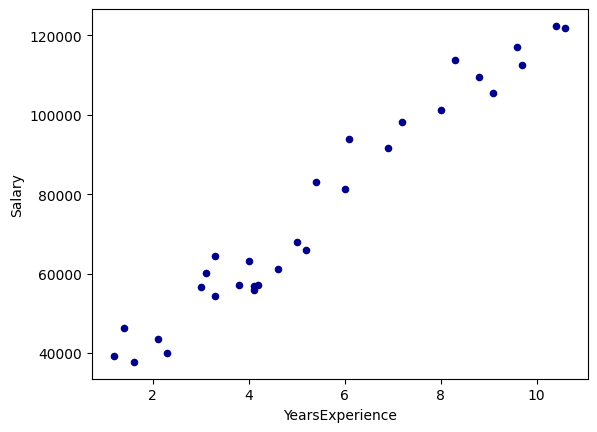

In [28]:
# simple scatter plot of dataset
ax1 = salary_df.plot.scatter(x='YearsExperience',
                             y='Salary',
                             c='DarkBlue')

In [29]:
X = salary_df['YearsExperience']
y = salary_df['Salary']
y.sample(5)

26    116970.0
21     98274.0
11     55795.0
12     56958.0
15     67939.0
Name: Salary, dtype: float64

In [30]:
if isinstance(y, pd.Series):
    y = y.values.reshape(-1, 1)

In [31]:
# train/test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [32]:
"""
Feature scaling makes gradient descent converge faster 
and more reliably by putting all features on a similar scale, 
preventing numerical instability and dominance by large-valued features.
"""

# # feature scaling, which is important for gradient descent (manual implementation)
# u = np.mean(X_train, axis=0)
# std_deviation = np.std(X_train, axis=0)
# X_train_scaled = (X_train-u) / std_deviation
# X_test_scaled = (X_test-u) / std_deviation

# u_y = np.mean(y_train)
# std_y = np.std(y_train)
# y_train_scaled = (y_train - u_y) / std_y

# it is basically a manual implementation of:
"""
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
"""

'\nfrom sklearn.preprocessing import StandardScaler\nscaler = StandardScaler()\nX_train_scaled = scaler.fit_transform(X_train)\nX_test_scaled = scaler.transform(X_test)\n'

In [33]:
# adding bias term (y-intercept in y=mx+c)
X_train.shape[0] # basically count of train data, should be 24 vertical in this case
# adding column of 1s into the X_train vector
m = X_train.shape[0]
X_train_ones = np.c_[np.ones((m, 1)), X_train]  # shape (m, n+1)

In [34]:
X_train_ones

array([[ 1. , 10.4],
       [ 1. ,  8.8],
       [ 1. ,  4.1],
       [ 1. ,  1.2],
       [ 1. ,  2.3],
       [ 1. ,  5.2],
       [ 1. ,  3. ],
       [ 1. ,  4.2],
       [ 1. ,  4.1],
       [ 1. ,  8. ],
       [ 1. ,  1.4],
       [ 1. ,  1.6],
       [ 1. ,  9.1],
       [ 1. ,  2.1],
       [ 1. ,  7.2],
       [ 1. ,  9.6],
       [ 1. ,  6. ],
       [ 1. , 10.6],
       [ 1. ,  6.9],
       [ 1. ,  3.3],
       [ 1. ,  4. ],
       [ 1. ,  4.6],
       [ 1. ,  6.1],
       [ 1. ,  3.1]])

In [35]:
"""
y = mx+c is basically in code, y = X.dot(theta), where
theta is m (gradient)
"""

'\ny = mx+c is basically in code, y = X.dot(theta), where\ntheta is m (gradient)\n'

In [36]:
# defining cost function (MSE)
def cost_function(X, y, theta):
    m = len(y)
    cost = np.sum((X.dot(theta) - y) ** 2) / (2*m)
    return cost

In [37]:
# implementing gradient descent
def gradient_descent(X, y, theta, learning_rate, epochs):
    m = len(y)
    cost_history = []
    theta_history = []

    # initialising theta (gradient) to 0
    for i in range (epochs):
        y_pred = X.dot(theta)
        # computing errors (distance between best-fit line & points), for adjusment of BFL
        error = y_pred - y
        # compute gradient
        gradient = (1/m) * X.T.dot(error)
        # update theta
        theta = theta - learning_rate * gradient
        # compute cost, theta history
        cost = cost_function(X,y,theta)
        cost_history.append(cost)
        theta_history.append(theta.copy())
    
    return theta, cost_history, theta_history
    
# learning rate, iterations determined when calling the function

In [38]:
# implement cross validation as well

In [39]:
n_features = X_train_ones.shape[1]
epochs = 250
theta=np.zeros((n_features, 1))
# run training
final_theta_vector, final_costs, theta_history = gradient_descent(
    X=X_train_ones,
    y=y_train,
    theta=theta,
    learning_rate=0.01,
    epochs=epochs
)

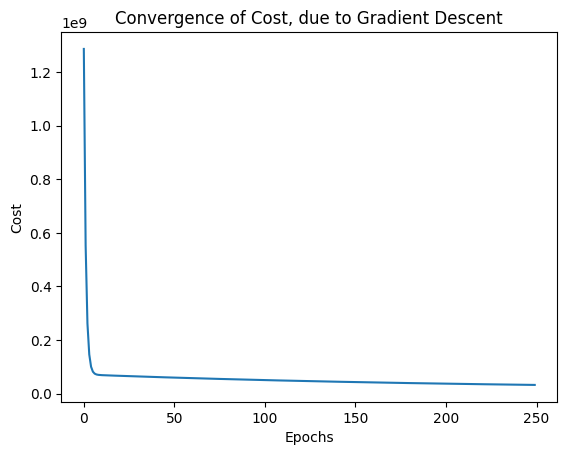

In [40]:
# visualise convergence of cost during training
plt.plot(range(epochs), final_costs)
plt.xlabel('Epochs')
plt.ylabel('Cost')
plt.title('Convergence of Cost, due to Gradient Descent')
plt.show()

In [41]:
# animation

Test MSE:  84172264.0540
Test RMSE: 9174.5444
Test MAE:  7651.9957
Test R²:   0.8352


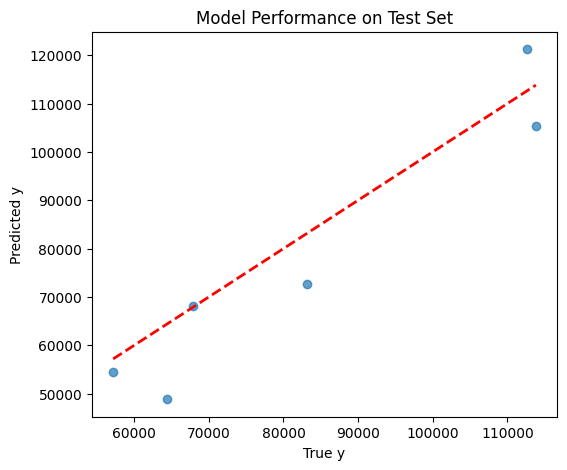

In [42]:
# model evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 1) Make sure y_test is a column vector
y_test = y_test.reshape(-1, 1)   # from shape (m,) → (m,1)

# 2) Add bias column to X_test
m_test     = X_test.shape[0]
X_test_ones = np.c_[np.ones((m_test, 1)), X_test]  # shape (m_test, n_features)

# 3) Predict on the test set
y_pred = X_test_ones.dot(final_theta_vector)  # shape (m_test,1)

# 4) Compute evaluation metrics
mse  = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae  = mean_absolute_error(y_test, y_pred)
r2   = r2_score(y_test, y_pred)

print(f"Test MSE:  {mse:.4f}")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test MAE:  {mae:.4f}")
print(f"Test R²:   {r2:.4f}")

# 5) (Optional) Scatter plot of true vs. predicted
plt.figure(figsize=(6, 5))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         'r--', lw=2)
plt.xlabel("True y")
plt.ylabel("Predicted y")
plt.title("Model Performance on Test Set")
plt.show()

Train MSE:  64891174.8101
Train RMSE: 8055.5059
Train MAE:  6408.3549
Train R²:   0.9151


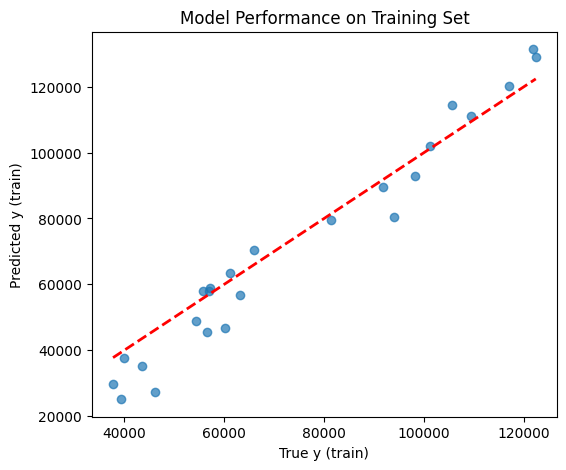

In [43]:
# 1) Make sure y_train is a column vector
y_train = y_train.reshape(-1, 1)   # (m, ) → (m, 1)

# 2) Predict on the training set
y_pred_train = X_train_ones.dot(final_theta_vector)  # (m,1)

# 3) Compute evaluation metrics
mse_train  = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
mae_train  = mean_absolute_error(y_train, y_pred_train)
r2_train   = r2_score(y_train, y_pred_train)

print(f"Train MSE:  {mse_train:.4f}")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train MAE:  {mae_train:.4f}")
print(f"Train R²:   {r2_train:.4f}")

# 4) (Optional) Scatter plot of true vs. predicted on train
plt.figure(figsize=(6, 5))
plt.scatter(y_train, y_pred_train, alpha=0.7)
plt.plot([y_train.min(), y_train.max()],
         [y_train.min(), y_train.max()],
         'r--', lw=2)
plt.xlabel("True y (train)")
plt.ylabel("Predicted y (train)")
plt.title("Model Performance on Training Set")
plt.show()

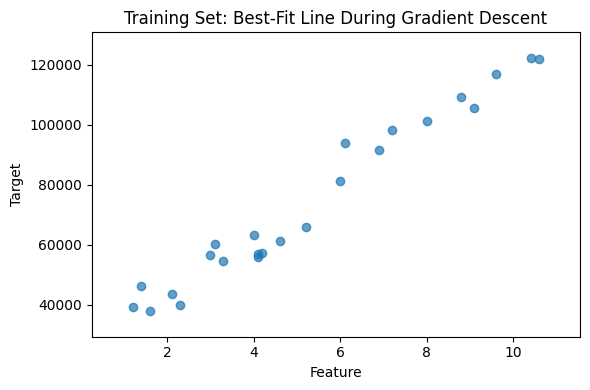

In [44]:
from IPython.display import HTML

# ─── Prep data ────────────────────────────────────────────────────────────────
# X_train_ones shape: (m, 2) with [1, x]; y_train shape: (m,1) or (m,)
x = X_train_ones[:, 1]
y = y_train.reshape(-1)   # flatten to 1D

# line domain
x_line = np.linspace(x.min(), x.max(), 100)

# ─── Build figure ─────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(6, 4))
ax.scatter(x, y, alpha=0.7)
line, = ax.plot([], [], 'r-', lw=2)
ax.set_xlim(x.min() - 0.1*(x.max()-x.min()), x.max() + 0.1*(x.max()-x.min()))
ax.set_ylim(y.min() - 0.1*(y.max()-y.min()), y.max() + 0.1*(y.max()-y.min()))
ax.set_xlabel("Feature")
ax.set_ylabel("Target")
ax.set_title("Training Set: Best‑Fit Line During Gradient Descent")

# ─── Animation callbacks ───────────────────────────────────────────────────────
def init():
    line.set_data([], [])
    return line,

def update(i):
    θ0, θ1 = theta_history[i].ravel()
    y_line = θ0 + θ1 * x_line
    line.set_data(x_line, y_line)
    return line,

# ─── Create animation ─────────────────────────────────────────────────────────
ani = FuncAnimation(
    fig, update,
    frames=len(theta_history),
    init_func=init,
    blit=False,
    interval=50
)

plt.tight_layout()

# ─── Embed inline via JS ──────────────────────────────────────────────────────
HTML(ani.to_jshtml())
